# Deep Convolution Generative Adversarial Network
Combine the use of GAN and CNN to generate an image that looks realistic

In [1]:
'''import modules'''
import pickle as pkl
import numpy as np
import tensorflow as tf
from scipy.io import loadmat
import matplotlib.pyplot as plt
%matplotlib inline

## getting the data
data that we used is google street view house number dataset

In [2]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm #this module used to create a progress bar while downloading

data_dir = 'data/'

#check directory
if not isdir(data_dir):
    raise Exception("Data directory doesn't exists")
    
'''create class for tqdm object'''
class download_progress(tqdm):
    last_block = 0
    
    def hook(self, block_number = 1, block_size = 1, total_size = None):
        self.total = total_size
        self.update((block_number - self.last_block) * block_size)
        self.last_block = block_number
        
#check file for train and test
if not isfile(data_dir + "train_32x32.mat"):
    with download_progress(unit = 'B', unit_scale = True, miniters = 1, desc = 'SVHN Training Set') as progress_bar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat', progress_bar.hook)
        
if not isfile(data_dir + "test_32x32.mat"):
    with download_progress(unit = 'B', unit_scale = True, miniters = 1, desc = 'SVHN Test set') as progress_bar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat', 
            data_dir + 'test_32x32.mat', progress_bar.hook)

In [3]:
'''load those datasets'''
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

## plot some samples from dataset

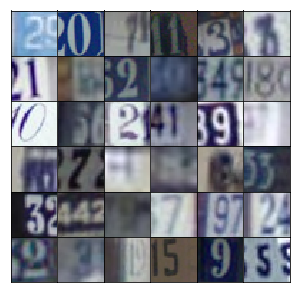

In [4]:
#get random index for 36 subplots
idx = np.random.randint(0, trainset['X'].shape[3], size = 36)
#create a 36 subplots
fig, axes = plt.subplots(6, 6, sharex = True, sharey = True, figsize = (5, 5), )
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:, :, :, ii], aspect = 'equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
    
plt.subplots_adjust(wspace = 0, hspace = 0)

## rescale the images
since our generator input will be scaled into range(-1, 1), we also need to rescale the images in dataset into this range

In [5]:
def scale(x, feature_range = (-1, 1)):
    #scale to (0, 1)
    x = ((x - x.min()) / (255 - x.min()))
    #scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    
    return x

## code class dataset

In [6]:
class Dataset:
    def __init__(self, train, test, val_frac = 0.5, shuffle = False, scale_func = None):
        split_idx = int(len(test['y']) * (1 - val_frac))
        
        self.test_x, self.valid_x = test['X'][ :, :, :, : split_idx], test['X'][ :, :, :, split_idx : ]
        self.test_y, self.valid_y = test['y'][ :, : split_idx], test['y'][ : , split_idx : ]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 1)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
            
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
            
        number_batches = len(self.train_y) // batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii : ii + batch_size]
            y = self.train_y[ii : ii + batch_size]
            
            yield self.scaler(x), y

## network inputs
placeholders for input stream

In [7]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, shape = (None, *real_dim), name = 'input_real')
    inputs_z = tf.placeholder(tf.float32, shape = (None, z_dim), name = 'input_z')
    
    return inputs_real, inputs_z

## generator network
a random latent space with 1x100 reshape to 4x4x512(NN) -> 8x8x256(conv2d_transpose) -> 16x16x128(conv2d_transpose) -> 32x32x3(conv2d_transpose)

In [8]:
def generator(z, output_dim, reuse = False, alpha = 0.2, training = True):
    with tf.variable_scope('generator', reuse = reuse):
        '''first fully connected layer'''
        x1 = tf.layers.dense(z, 4 * 4 * 512)
        '''reshape it to start the convolutional stack'''
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training = training)
        x1 = tf.maximum(alpha * x1, x1) #leaky relu function
        '''4x4x512 now'''
        
        '''starts of convolutional transpose'''
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides = 2, padding = 'same')
        x2 = tf.layers.batch_normalization(x2, training = training)
        x2 = tf.maximum(alpha * x2, x2)
        '''8x8x256 now'''
        
        x3 = tf.layers.conv2d_transpose(x2, 512, 5, strides = 2, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training = training)
        x3 = tf.maximum(alpha * x3, x3)
        '''16x16x128'''
        
        '''output layer'''
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides = 2, padding = 'same')
        '''32x32x64'''
        
        out = tf.tanh(logits)
        
        return out

## discriminator network
this is basically a usual CNN with 16x16x64 -> 8x8x128 -> 4x4x256 then flatten it to a NN with 4x4x256 that flatten

In [9]:
def discriminator(x, reuse = False, alpha = 0.2):
    with tf.variable_scope('discriminator', reuse = reuse):
        '''input layer is 32x32x3'''
        x1 = tf.layers.conv2d(x, 64, 5, strides = 2, padding = 'same')
        relu1 = tf.maximum(alpha * x1, x1)
        '''16x16x64 now'''
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides = 2, padding = 'same')
        batch_normalization2 = tf.layers.batch_normalization(x2, training = True)
        relu2 = tf.maximum(alpha * batch_normalization2, batch_normalization2)
        '''8x8x128'''
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides = 2, padding = 'same')
        batch_normalization3 = tf.layers.batch_normalization(x3, training = True)
        relu3 = tf.maximum(alpha * batch_normalization3, batch_normalization3)
        '''4x4x256'''
        
        '''flatten it into dimension 1 x (4x4x256)'''
        flat = tf.reshape(relu3, (-1, 4 * 4 * 256))
        logits = tf.layers.dense(flat, 1) #one output node
        out = tf.sigmoid(logits)
        
        return out, logits

## model loss

In [10]:
def model_loss(input_real, input_z, output_dim, alpha = 0.2):
    '''should produce the model first'''
    generator_model = generator(input_z, output_dim, alpha = alpha)
    discriminator_model_real, discriminator_logits_real = discriminator(input_real, alpha = alpha)
    discriminator_model_fake, discriminator_logits_fake = discriminator(generator_model, reuse = True, alpha = alpha)
    
    '''loss function'''
    discriminator_loss_real = tf.reduce_mean(
                                tf.nn.sigmoid_cross_entropy_with_logits(
                                    labels = tf.ones_like(discriminator_model_real), 
                                    logits = discriminator_logits_real))
    
    discriminator_loss_fake = tf.reduce_mean(
                                tf.nn.sigmoid_cross_entropy_with_logits(
                                    labels = tf.zeros_like(discriminator_model_fake),
                                    logits = discriminator_logits_fake))
    
    discriminator_loss = discriminator_loss_real + discriminator_loss_fake
    
    generator_loss = tf.reduce_mean(
                        tf.nn.sigmoid_cross_entropy_with_logits(
                            labels = tf.ones_like(discriminator_model_fake), 
                            logits = discriminator_logits_fake))
    
    return discriminator_loss, generator_loss

## optimizers
split into optimizers for generator and discriminator

In [11]:
def model_optimizer(discriminator_loss, generator_loss, learning_rate, beta1):
    '''get weights and bias to update'''
    trainable_variables = tf.trainable_variables()
    discriminator_variables = [variable for variable in trainable_variables if variable.name.startswith('discriminator')]
    generator_variables = [variable for variable in trainable_variables if variable.name.startswith('generator')]
    
    '''optimize'''
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        discriminator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(discriminator_loss, 
                                                                                                     var_list = discriminator_variables)
        
        generator_train_optimizer = tf.train.AdamOptimizer(learning_rate, beta1 = beta1).minimize(generator_loss, 
                                                                                                     var_list = generator_variables)
        
        return discriminator_train_optimizer, generator_train_optimizer

# building the model
is basically is create an object that use all function coded above

In [12]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha = 0.2, beta1 = 0.5):
        tf.reset_default_graph()
        
        '''build model inputs, using model_inputs function'''
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        '''model loss, using model_loss function'''
        self.discriminator_loss, self.generator_loss = model_loss(self.input_real, self.input_z, 
                                                                 real_size[2], alpha = alpha)
        '''model optimizers, using model_optimizer function'''
        self.discriminator_optimizer, self.generator_optimizer = model_optimizer(self.discriminator_loss, 
                                                                                 self.generator_loss, learning_rate, 
                                                                                 beta1)

# function to train  the DCGAN

In [13]:
'''net parameter is actually an object of GAN class'''
def train(net, dataset, epochs, batch_size, print_every = 10, show_every = 100, figsize = (5, 5)):
    '''saver'''
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size = (72, z_size))
    
    samples, losses = [], []
    steps = 0
    
    with tf.Session() as sess:
        '''run variable initializers'''
        sess.run(tf.global_variables_initializer())
        '''run tensorboard writer'''
        writer = tf.summary.FileWriter('./graphs/DCGAN', sess.graph)
        
        '''for each epoch'''
        for epoch in range(epochs):
            '''for each sample in each batch'''
            for x, y in dataset.batches(batch_size):
                steps += 1
                
                '''sample random noise for generator'''
                batch_z = np.random.uniform(-1, 1, size = (batch_size, z_size))
                
                '''run optimizers'''
                _ = sess.run(net.discriminator_optimizer, feed_dict = {net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.generator_optimizer, feed_dict = {net.input_z: batch_z, net.input_real: x})
                
                '''calculate loss, only if print_every'''
                if steps % print_every == 0:
                    '''at the end of each epoch, get the losses and print out'''
                    train_loss_discriminator = net.discriminator_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_generator = net.generator_loss.eval({net.input_z: batch_z})
                    
                    print("epoch {}/{} discriminator_loss: {:.4f} generator_loss: {:.4f}".
                         format(epoch, epochs, train_loss_discriminator, train_loss_generator))
                    
                    '''save losses for plot later'''
                    losses.append((train_loss_discriminator, train_loss_generator))
                    
                '''generate and plot samples if show_every
                   reuse model and weights trained
                   sample_z is a random latent space
                '''
                if steps % show_every == 0:
                    generated_samples = sess.run(
                                        generator(net.input_z, 3, reuse = True, training = False), 
                                        feed_dict = {net.input_z: sample_z})
                    
                    samples.append(generated_samples)
                    
                    _ = view_samples(-1, samples, 6, 12, figsize = figsize)
                    plt.show()
                    
        saver.save(sess, '.checkpoints/generator.ckpt')
        writer.close()
        
    with open('samples.pkl', 'wb') as file:
        pkl.dump(samples, file)
        
    return losses, samples

## view samples

In [14]:
def view_samples(epoch, sample, nrows, ncols, figsize = (5, 5)):
    fig, axes = plt.subplots(figsize = figsize, nrows = nrows, ncols = ncols, 
                            sharex = True, sharey = True)
    
    for ax, img in zip(axes.flatten(), sample[epoch]):
        ax.axis('off')
        img = ((img - img.min()) * 255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('datalim')
        im = ax.imshow(img, aspect = 'equal')
        
    plt.subplots_adjust(wspace = 0, hspace = 0)
    
    return fig, axes

## hyperparameter

In [ ]:
real_size = (32, 32, 3) #an output of an image
z_size = 100
learning_rate = 0.0002
batch_size = 128
epochs = 30
alpha = 0.2
beta1 = 0.5

# create the object for all classes and run the model

epoch 0/30 discriminator_loss: 2.7129 generator_loss: 0.1127
epoch 0/30 discriminator_loss: 0.5874 generator_loss: 1.3974
epoch 0/30 discriminator_loss: 0.3019 generator_loss: 1.9366
epoch 0/30 discriminator_loss: 0.4771 generator_loss: 1.1336
epoch 0/30 discriminator_loss: 0.3377 generator_loss: 1.9613
epoch 0/30 discriminator_loss: 0.1318 generator_loss: 3.2213
epoch 0/30 discriminator_loss: 0.1542 generator_loss: 3.3399
epoch 0/30 discriminator_loss: 0.1856 generator_loss: 3.4062
epoch 0/30 discriminator_loss: 0.1316 generator_loss: 4.9064
epoch 0/30 discriminator_loss: 0.1729 generator_loss: 3.1674


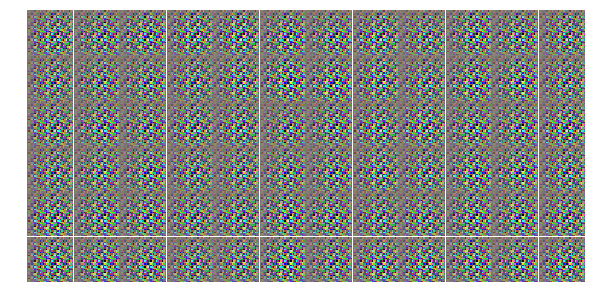

epoch 0/30 discriminator_loss: 0.0812 generator_loss: 3.2621
epoch 0/30 discriminator_loss: 0.1529 generator_loss: 2.3491
epoch 0/30 discriminator_loss: 0.1074 generator_loss: 3.4257
epoch 0/30 discriminator_loss: 0.1423 generator_loss: 2.9135
epoch 0/30 discriminator_loss: 0.1508 generator_loss: 3.3510
epoch 0/30 discriminator_loss: 0.3233 generator_loss: 1.7032
epoch 0/30 discriminator_loss: 0.0957 generator_loss: 4.1205
epoch 0/30 discriminator_loss: 0.1097 generator_loss: 3.2128
epoch 0/30 discriminator_loss: 0.1666 generator_loss: 3.5895
epoch 0/30 discriminator_loss: 0.2862 generator_loss: 2.3065


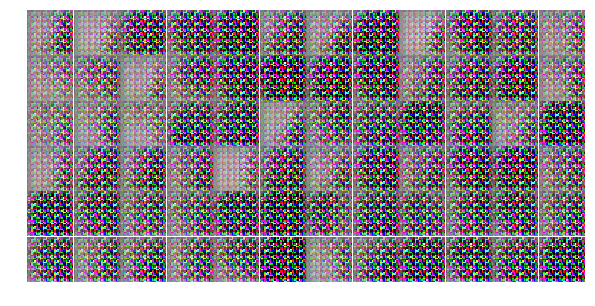

epoch 0/30 discriminator_loss: 0.2439 generator_loss: 3.2677
epoch 0/30 discriminator_loss: 0.4007 generator_loss: 1.9064
epoch 0/30 discriminator_loss: 0.3474 generator_loss: 1.6974
epoch 0/30 discriminator_loss: 0.5344 generator_loss: 1.4092
epoch 0/30 discriminator_loss: 0.3277 generator_loss: 1.9199
epoch 0/30 discriminator_loss: 0.2593 generator_loss: 1.9661
epoch 0/30 discriminator_loss: 0.2920 generator_loss: 1.9977
epoch 0/30 discriminator_loss: 0.3058 generator_loss: 2.1339
epoch 0/30 discriminator_loss: 0.2749 generator_loss: 2.4864
epoch 0/30 discriminator_loss: 0.1721 generator_loss: 2.6945


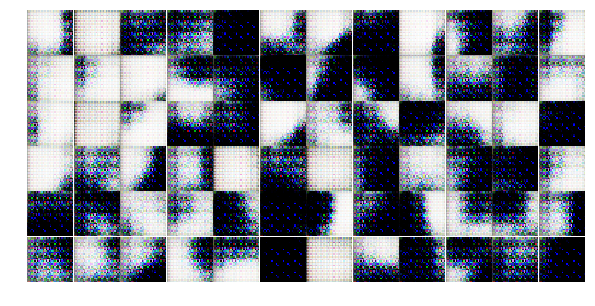

epoch 0/30 discriminator_loss: 0.1991 generator_loss: 2.3911
epoch 0/30 discriminator_loss: 0.2686 generator_loss: 1.8995
epoch 0/30 discriminator_loss: 0.2323 generator_loss: 2.0491
epoch 0/30 discriminator_loss: 0.1507 generator_loss: 2.5475
epoch 0/30 discriminator_loss: 0.1731 generator_loss: 2.3724
epoch 0/30 discriminator_loss: 0.1113 generator_loss: 3.1082
epoch 0/30 discriminator_loss: 0.1522 generator_loss: 3.0561
epoch 0/30 discriminator_loss: 0.1136 generator_loss: 3.1014
epoch 0/30 discriminator_loss: 0.2064 generator_loss: 2.4005
epoch 0/30 discriminator_loss: 0.2228 generator_loss: 3.0414


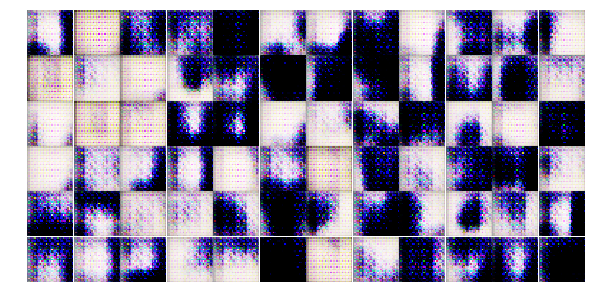

epoch 0/30 discriminator_loss: 0.1902 generator_loss: 2.6084
epoch 0/30 discriminator_loss: 0.2726 generator_loss: 1.7458
epoch 0/30 discriminator_loss: 0.3421 generator_loss: 3.2954
epoch 0/30 discriminator_loss: 0.2255 generator_loss: 2.3785
epoch 0/30 discriminator_loss: 0.4836 generator_loss: 1.4838
epoch 0/30 discriminator_loss: 0.4941 generator_loss: 2.1034
epoch 0/30 discriminator_loss: 0.3895 generator_loss: 1.6714
epoch 0/30 discriminator_loss: 0.7912 generator_loss: 1.5109
epoch 0/30 discriminator_loss: 0.6046 generator_loss: 1.2859
epoch 0/30 discriminator_loss: 0.5247 generator_loss: 1.8505


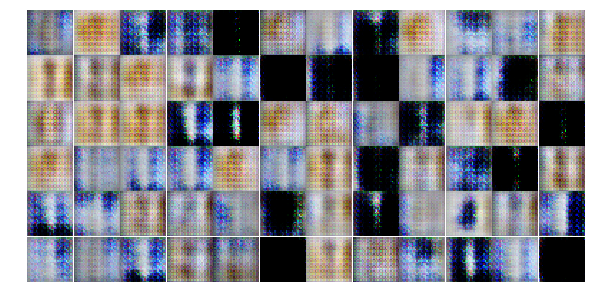

epoch 0/30 discriminator_loss: 0.5810 generator_loss: 1.5478
epoch 0/30 discriminator_loss: 0.5240 generator_loss: 1.2544
epoch 0/30 discriminator_loss: 0.4918 generator_loss: 1.3051
epoch 0/30 discriminator_loss: 0.5552 generator_loss: 1.5869
epoch 0/30 discriminator_loss: 0.4336 generator_loss: 2.2726
epoch 0/30 discriminator_loss: 0.2628 generator_loss: 2.2995
epoch 0/30 discriminator_loss: 0.4730 generator_loss: 2.0445
epoch 1/30 discriminator_loss: 0.5475 generator_loss: 1.1483
epoch 1/30 discriminator_loss: 0.3614 generator_loss: 2.7012
epoch 1/30 discriminator_loss: 0.2312 generator_loss: 2.5076


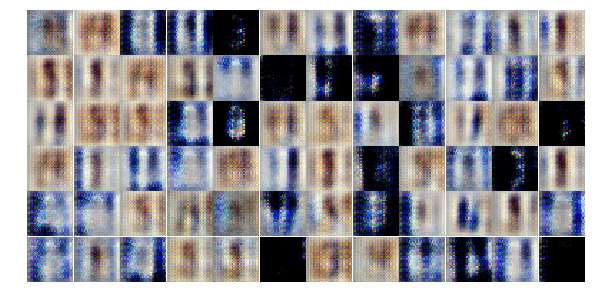

epoch 1/30 discriminator_loss: 0.4508 generator_loss: 1.2963
epoch 1/30 discriminator_loss: 0.2395 generator_loss: 3.3851
epoch 1/30 discriminator_loss: 0.4478 generator_loss: 2.8844
epoch 1/30 discriminator_loss: 0.1766 generator_loss: 2.9150
epoch 1/30 discriminator_loss: 0.6614 generator_loss: 0.9402
epoch 1/30 discriminator_loss: 0.3204 generator_loss: 1.6689
epoch 1/30 discriminator_loss: 0.6438 generator_loss: 3.5260
epoch 1/30 discriminator_loss: 0.4671 generator_loss: 1.4788
epoch 1/30 discriminator_loss: 0.2065 generator_loss: 3.0411
epoch 1/30 discriminator_loss: 0.2008 generator_loss: 2.4666


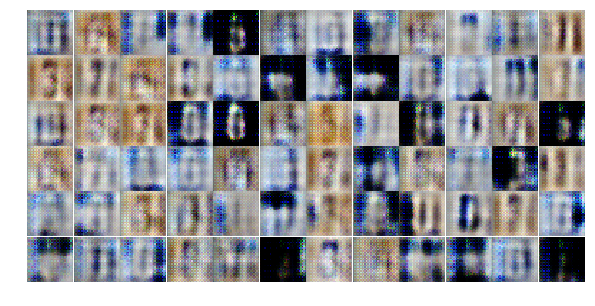

epoch 1/30 discriminator_loss: 0.5055 generator_loss: 1.1548
epoch 1/30 discriminator_loss: 0.3135 generator_loss: 1.9188
epoch 1/30 discriminator_loss: 0.2175 generator_loss: 4.0706
epoch 1/30 discriminator_loss: 0.1488 generator_loss: 2.7812
epoch 1/30 discriminator_loss: 0.8014 generator_loss: 0.7361
epoch 1/30 discriminator_loss: 0.7262 generator_loss: 0.8477
epoch 1/30 discriminator_loss: 0.3021 generator_loss: 2.0113
epoch 1/30 discriminator_loss: 0.9223 generator_loss: 0.6314
epoch 1/30 discriminator_loss: 1.1962 generator_loss: 0.5239
epoch 1/30 discriminator_loss: 0.8716 generator_loss: 3.9431


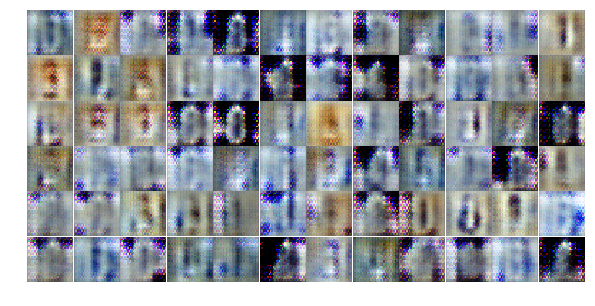

epoch 1/30 discriminator_loss: 0.5894 generator_loss: 2.1237
epoch 1/30 discriminator_loss: 0.3970 generator_loss: 2.5549
epoch 1/30 discriminator_loss: 0.4704 generator_loss: 2.1297
epoch 1/30 discriminator_loss: 0.6063 generator_loss: 0.9801
epoch 1/30 discriminator_loss: 1.3717 generator_loss: 0.4722
epoch 1/30 discriminator_loss: 0.3165 generator_loss: 2.3163
epoch 1/30 discriminator_loss: 0.2133 generator_loss: 2.4664
epoch 1/30 discriminator_loss: 0.6029 generator_loss: 1.1505
epoch 1/30 discriminator_loss: 0.1163 generator_loss: 3.2911
epoch 1/30 discriminator_loss: 0.2935 generator_loss: 2.7043


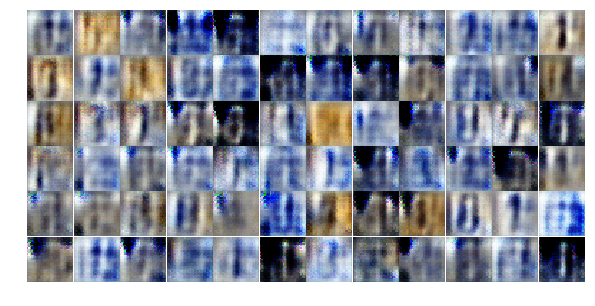

epoch 1/30 discriminator_loss: 0.5141 generator_loss: 1.5132
epoch 1/30 discriminator_loss: 0.2564 generator_loss: 2.4141
epoch 1/30 discriminator_loss: 0.2923 generator_loss: 3.0853
epoch 1/30 discriminator_loss: 0.1872 generator_loss: 3.8326
epoch 1/30 discriminator_loss: 0.3078 generator_loss: 2.5331
epoch 1/30 discriminator_loss: 0.4891 generator_loss: 1.3550
epoch 1/30 discriminator_loss: 0.5077 generator_loss: 2.3581
epoch 1/30 discriminator_loss: 0.2769 generator_loss: 3.2616
epoch 1/30 discriminator_loss: 0.3626 generator_loss: 1.7660
epoch 1/30 discriminator_loss: 0.2102 generator_loss: 4.2496


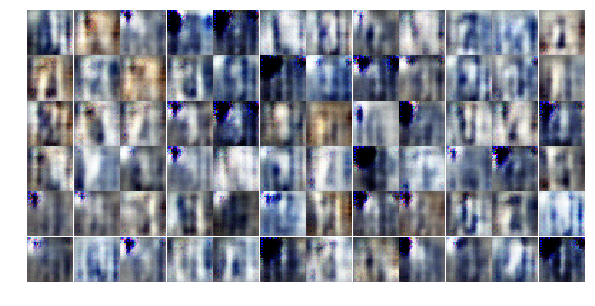

epoch 1/30 discriminator_loss: 0.5351 generator_loss: 1.8970
epoch 1/30 discriminator_loss: 0.3424 generator_loss: 2.1954
epoch 1/30 discriminator_loss: 0.1325 generator_loss: 6.7009
epoch 1/30 discriminator_loss: 0.2879 generator_loss: 2.7874
epoch 1/30 discriminator_loss: 0.2778 generator_loss: 3.7529
epoch 1/30 discriminator_loss: 0.6172 generator_loss: 1.8447
epoch 1/30 discriminator_loss: 0.9219 generator_loss: 0.7350
epoch 1/30 discriminator_loss: 0.5612 generator_loss: 1.4631
epoch 1/30 discriminator_loss: 0.2531 generator_loss: 2.2871
epoch 1/30 discriminator_loss: 0.2477 generator_loss: 2.8147


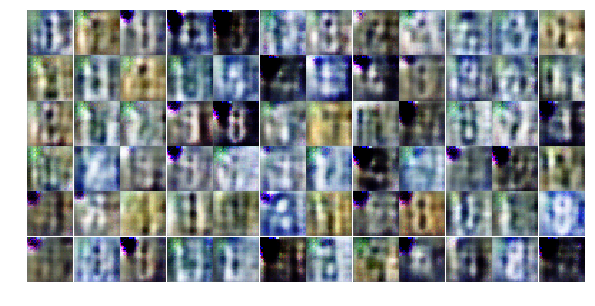

epoch 1/30 discriminator_loss: 0.6541 generator_loss: 2.0535
epoch 1/30 discriminator_loss: 0.6767 generator_loss: 4.0977
epoch 1/30 discriminator_loss: 1.1541 generator_loss: 4.3690
epoch 1/30 discriminator_loss: 0.5937 generator_loss: 3.2388
epoch 2/30 discriminator_loss: 0.9496 generator_loss: 0.6538
epoch 2/30 discriminator_loss: 0.4698 generator_loss: 1.7135
epoch 2/30 discriminator_loss: 0.3523 generator_loss: 2.3424
epoch 2/30 discriminator_loss: 0.3220 generator_loss: 4.1141
epoch 2/30 discriminator_loss: 0.5627 generator_loss: 1.3492
epoch 2/30 discriminator_loss: 0.3369 generator_loss: 3.7294


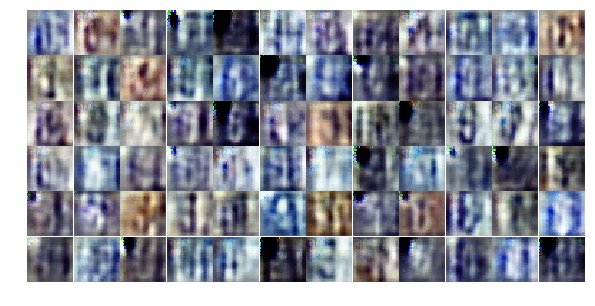

epoch 2/30 discriminator_loss: 0.2258 generator_loss: 3.2696
epoch 2/30 discriminator_loss: 0.6492 generator_loss: 2.8059
epoch 2/30 discriminator_loss: 0.9511 generator_loss: 0.8003
epoch 2/30 discriminator_loss: 0.3727 generator_loss: 2.2922
epoch 2/30 discriminator_loss: 0.3475 generator_loss: 2.1865
epoch 2/30 discriminator_loss: 0.5237 generator_loss: 1.3314
epoch 2/30 discriminator_loss: 0.3618 generator_loss: 3.1323
epoch 2/30 discriminator_loss: 0.7783 generator_loss: 1.2955
epoch 2/30 discriminator_loss: 0.5665 generator_loss: 1.3827
epoch 2/30 discriminator_loss: 0.6321 generator_loss: 1.9107


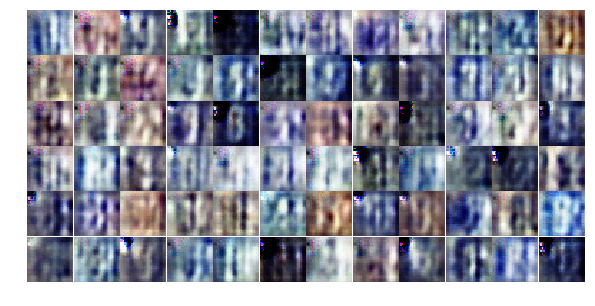

epoch 2/30 discriminator_loss: 0.2662 generator_loss: 3.1634
epoch 2/30 discriminator_loss: 0.3856 generator_loss: 2.7018
epoch 2/30 discriminator_loss: 0.2258 generator_loss: 3.1516
epoch 2/30 discriminator_loss: 0.4061 generator_loss: 3.2148
epoch 2/30 discriminator_loss: 0.2046 generator_loss: 3.8490
epoch 2/30 discriminator_loss: 0.4959 generator_loss: 1.9187
epoch 2/30 discriminator_loss: 0.2262 generator_loss: 2.2842
epoch 2/30 discriminator_loss: 0.5041 generator_loss: 1.5941
epoch 2/30 discriminator_loss: 0.2479 generator_loss: 3.0522
epoch 2/30 discriminator_loss: 0.6384 generator_loss: 1.9177


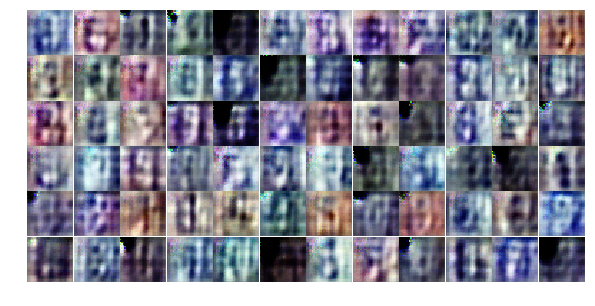

epoch 2/30 discriminator_loss: 0.5571 generator_loss: 1.8234
epoch 2/30 discriminator_loss: 0.6146 generator_loss: 1.2582
epoch 2/30 discriminator_loss: 0.4750 generator_loss: 2.2326
epoch 2/30 discriminator_loss: 0.8022 generator_loss: 0.9955
epoch 2/30 discriminator_loss: 0.5729 generator_loss: 3.9626
epoch 2/30 discriminator_loss: 0.6760 generator_loss: 2.7282
epoch 2/30 discriminator_loss: 0.4330 generator_loss: 2.4155
epoch 2/30 discriminator_loss: 0.5605 generator_loss: 3.0415
epoch 2/30 discriminator_loss: 0.8532 generator_loss: 1.8289
epoch 2/30 discriminator_loss: 0.5365 generator_loss: 1.3575


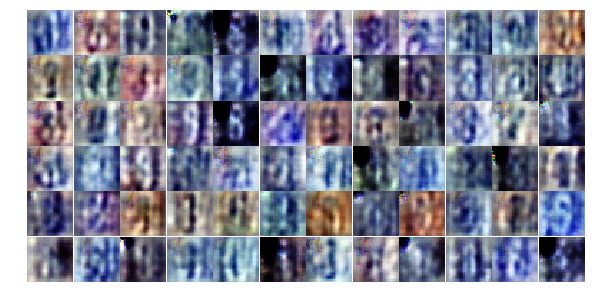

epoch 2/30 discriminator_loss: 0.9105 generator_loss: 0.8251
epoch 2/30 discriminator_loss: 0.4907 generator_loss: 1.7718
epoch 2/30 discriminator_loss: 0.4585 generator_loss: 4.5663
epoch 2/30 discriminator_loss: 0.4759 generator_loss: 1.8492
epoch 2/30 discriminator_loss: 0.5522 generator_loss: 1.3317
epoch 2/30 discriminator_loss: 0.7618 generator_loss: 1.3624
epoch 2/30 discriminator_loss: 0.7250 generator_loss: 1.1024
epoch 2/30 discriminator_loss: 0.4507 generator_loss: 1.7263
epoch 2/30 discriminator_loss: 0.3750 generator_loss: 3.7123
epoch 2/30 discriminator_loss: 0.4214 generator_loss: 2.6506


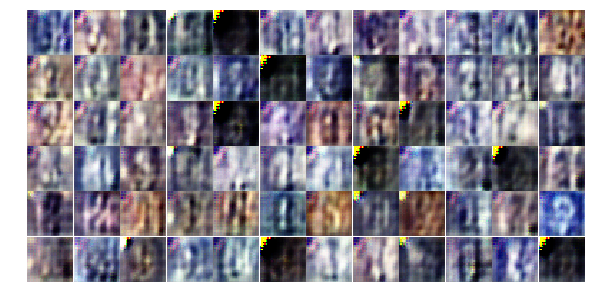

epoch 2/30 discriminator_loss: 0.4145 generator_loss: 2.0110
epoch 2/30 discriminator_loss: 0.1188 generator_loss: 4.6158
epoch 2/30 discriminator_loss: 0.7021 generator_loss: 1.5274
epoch 2/30 discriminator_loss: 0.1369 generator_loss: 5.0225
epoch 2/30 discriminator_loss: 0.3222 generator_loss: 2.9189
epoch 2/30 discriminator_loss: 0.2822 generator_loss: 2.9173
epoch 2/30 discriminator_loss: 0.1446 generator_loss: 3.3253
epoch 2/30 discriminator_loss: 0.0961 generator_loss: 5.2495
epoch 2/30 discriminator_loss: 0.3574 generator_loss: 2.6393
epoch 2/30 discriminator_loss: 0.0860 generator_loss: 5.2804


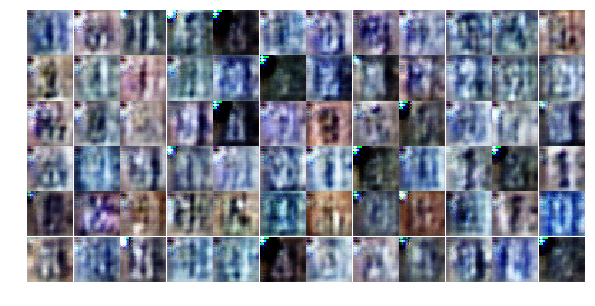

epoch 2/30 discriminator_loss: 0.1133 generator_loss: 4.1147
epoch 3/30 discriminator_loss: 0.6819 generator_loss: 1.1617
epoch 3/30 discriminator_loss: 0.3830 generator_loss: 2.7317
epoch 3/30 discriminator_loss: 0.2328 generator_loss: 2.7991
epoch 3/30 discriminator_loss: 0.1694 generator_loss: 3.4038
epoch 3/30 discriminator_loss: 0.3111 generator_loss: 2.6757
epoch 3/30 discriminator_loss: 0.3993 generator_loss: 1.7124
epoch 3/30 discriminator_loss: 0.1162 generator_loss: 4.1282
epoch 3/30 discriminator_loss: 0.1978 generator_loss: 3.3273
epoch 3/30 discriminator_loss: 0.1711 generator_loss: 3.5215


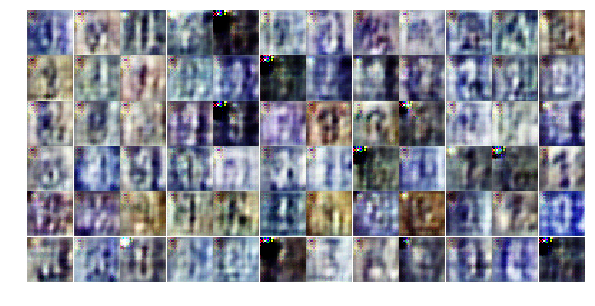

epoch 3/30 discriminator_loss: 0.2479 generator_loss: 2.6597
epoch 3/30 discriminator_loss: 0.1667 generator_loss: 3.3426
epoch 3/30 discriminator_loss: 2.1529 generator_loss: 0.6949
epoch 3/30 discriminator_loss: 1.0978 generator_loss: 0.6871
epoch 3/30 discriminator_loss: 0.8039 generator_loss: 1.9223
epoch 3/30 discriminator_loss: 0.4053 generator_loss: 2.3262
epoch 3/30 discriminator_loss: 1.0096 generator_loss: 1.7814
epoch 3/30 discriminator_loss: 0.8416 generator_loss: 1.2175
epoch 3/30 discriminator_loss: 0.8042 generator_loss: 1.1059
epoch 3/30 discriminator_loss: 0.8378 generator_loss: 1.1442


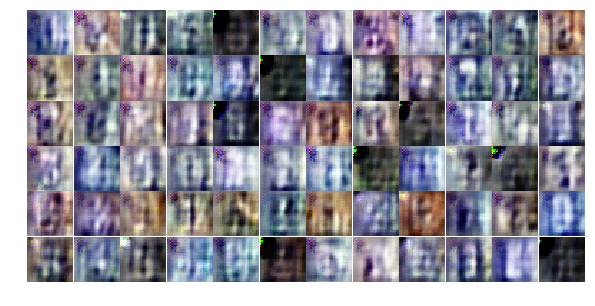

epoch 3/30 discriminator_loss: 0.8331 generator_loss: 1.0267
epoch 3/30 discriminator_loss: 0.6654 generator_loss: 1.4107
epoch 3/30 discriminator_loss: 0.8999 generator_loss: 2.0630
epoch 3/30 discriminator_loss: 0.5608 generator_loss: 1.6683
epoch 3/30 discriminator_loss: 0.8453 generator_loss: 0.9118
epoch 3/30 discriminator_loss: 0.6967 generator_loss: 1.8347
epoch 3/30 discriminator_loss: 1.1788 generator_loss: 1.3508
epoch 3/30 discriminator_loss: 0.3947 generator_loss: 2.7065
epoch 3/30 discriminator_loss: 0.6030 generator_loss: 2.1927
epoch 3/30 discriminator_loss: 0.6304 generator_loss: 1.7272


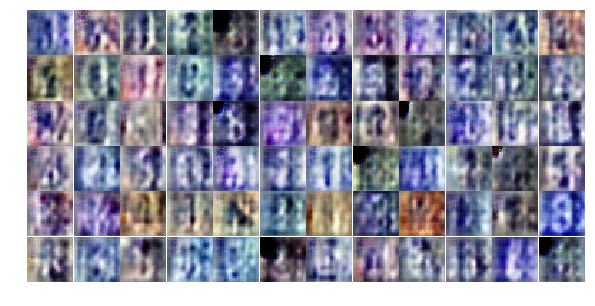

epoch 3/30 discriminator_loss: 0.7388 generator_loss: 0.9396
epoch 3/30 discriminator_loss: 0.6095 generator_loss: 1.6917
epoch 3/30 discriminator_loss: 0.9317 generator_loss: 0.9652
epoch 3/30 discriminator_loss: 0.5731 generator_loss: 1.7940
epoch 3/30 discriminator_loss: 0.8277 generator_loss: 1.0896
epoch 3/30 discriminator_loss: 0.7466 generator_loss: 1.6853
epoch 3/30 discriminator_loss: 1.2411 generator_loss: 2.1102
epoch 3/30 discriminator_loss: 0.5037 generator_loss: 1.6804
epoch 3/30 discriminator_loss: 0.8005 generator_loss: 1.8180
epoch 3/30 discriminator_loss: 0.6753 generator_loss: 1.3437


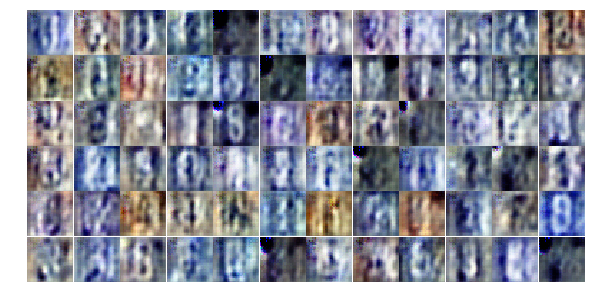

epoch 3/30 discriminator_loss: 0.5191 generator_loss: 5.2364
epoch 3/30 discriminator_loss: 0.8179 generator_loss: 2.5749
epoch 3/30 discriminator_loss: 0.8187 generator_loss: 1.2731
epoch 3/30 discriminator_loss: 0.3348 generator_loss: 2.6858
epoch 3/30 discriminator_loss: 0.5608 generator_loss: 2.0559
epoch 3/30 discriminator_loss: 0.5654 generator_loss: 2.1213
epoch 3/30 discriminator_loss: 0.3286 generator_loss: 3.0164
epoch 3/30 discriminator_loss: 0.4486 generator_loss: 3.4476
epoch 3/30 discriminator_loss: 0.4818 generator_loss: 2.5228
epoch 3/30 discriminator_loss: 0.2787 generator_loss: 2.9811


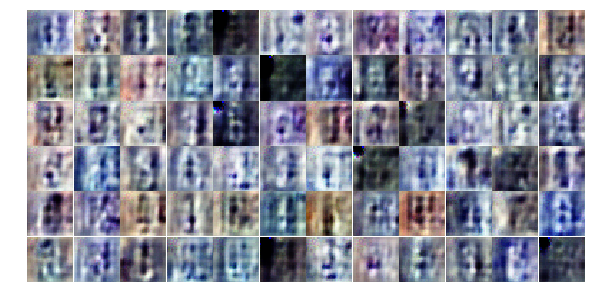

epoch 3/30 discriminator_loss: 0.2714 generator_loss: 2.7207
epoch 3/30 discriminator_loss: 0.5924 generator_loss: 1.4058
epoch 3/30 discriminator_loss: 0.6699 generator_loss: 1.7688
epoch 3/30 discriminator_loss: 0.9460 generator_loss: 0.7894
epoch 3/30 discriminator_loss: 0.7608 generator_loss: 1.2577
epoch 3/30 discriminator_loss: 0.6969 generator_loss: 2.5165
epoch 3/30 discriminator_loss: 0.9938 generator_loss: 1.1459
epoch 3/30 discriminator_loss: 0.8087 generator_loss: 1.0647
epoch 3/30 discriminator_loss: 1.4005 generator_loss: 0.5336
epoch 4/30 discriminator_loss: 0.3296 generator_loss: 2.9775


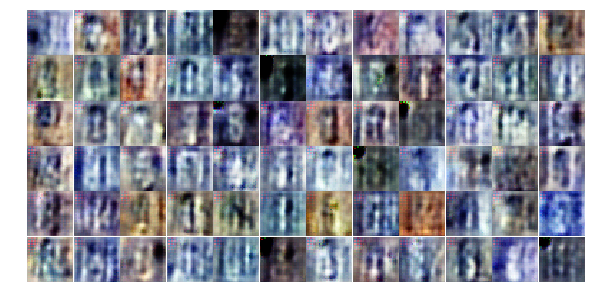

epoch 4/30 discriminator_loss: 0.6866 generator_loss: 1.7165
epoch 4/30 discriminator_loss: 0.9919 generator_loss: 1.8025
epoch 4/30 discriminator_loss: 0.9760 generator_loss: 1.2355
epoch 4/30 discriminator_loss: 0.6637 generator_loss: 2.3334
epoch 4/30 discriminator_loss: 0.6350 generator_loss: 1.4228
epoch 4/30 discriminator_loss: 0.9959 generator_loss: 1.9051
epoch 4/30 discriminator_loss: 1.4264 generator_loss: 1.4891
epoch 4/30 discriminator_loss: 0.7084 generator_loss: 1.4045
epoch 4/30 discriminator_loss: 0.8036 generator_loss: 1.7417
epoch 4/30 discriminator_loss: 0.7841 generator_loss: 0.9517


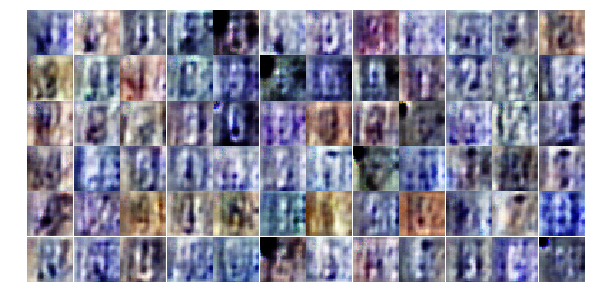

epoch 4/30 discriminator_loss: 1.3070 generator_loss: 2.5299
epoch 4/30 discriminator_loss: 0.4825 generator_loss: 1.7911
epoch 4/30 discriminator_loss: 0.5353 generator_loss: 2.2599
epoch 4/30 discriminator_loss: 0.8710 generator_loss: 1.1494
epoch 4/30 discriminator_loss: 0.7422 generator_loss: 1.5460
epoch 4/30 discriminator_loss: 0.7523 generator_loss: 1.3155
epoch 4/30 discriminator_loss: 0.8044 generator_loss: 1.1251
epoch 4/30 discriminator_loss: 0.7024 generator_loss: 1.3019
epoch 4/30 discriminator_loss: 0.4693 generator_loss: 4.1820
epoch 4/30 discriminator_loss: 0.6038 generator_loss: 1.8996


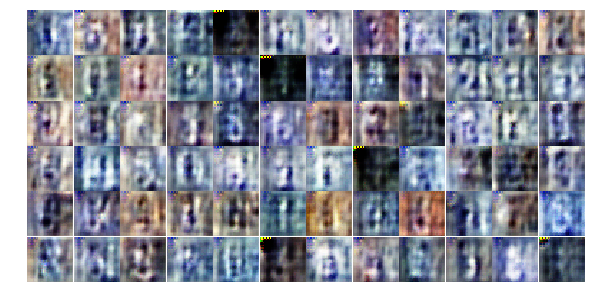

epoch 4/30 discriminator_loss: 0.5064 generator_loss: 2.2278
epoch 4/30 discriminator_loss: 0.3066 generator_loss: 2.8251
epoch 4/30 discriminator_loss: 0.3211 generator_loss: 3.1841
epoch 4/30 discriminator_loss: 0.1803 generator_loss: 3.0706
epoch 4/30 discriminator_loss: 0.7610 generator_loss: 1.0828
epoch 4/30 discriminator_loss: 0.4719 generator_loss: 1.9940
epoch 4/30 discriminator_loss: 0.7238 generator_loss: 1.0708
epoch 4/30 discriminator_loss: 0.6298 generator_loss: 1.4864
epoch 4/30 discriminator_loss: 1.9818 generator_loss: 0.2238
epoch 4/30 discriminator_loss: 1.2489 generator_loss: 1.0043


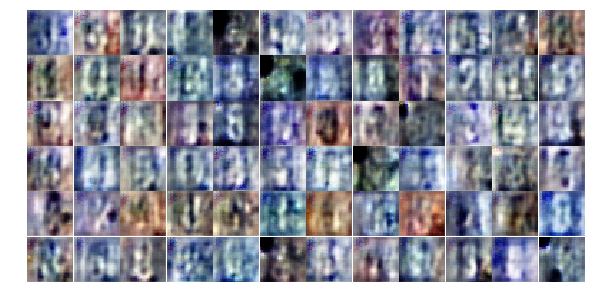

epoch 4/30 discriminator_loss: 0.5199 generator_loss: 2.4946
epoch 4/30 discriminator_loss: 0.6282 generator_loss: 1.8284
epoch 4/30 discriminator_loss: 0.8824 generator_loss: 1.8455
epoch 4/30 discriminator_loss: 0.6944 generator_loss: 1.6112
epoch 4/30 discriminator_loss: 0.7462 generator_loss: 1.1797
epoch 4/30 discriminator_loss: 1.0738 generator_loss: 1.6358
epoch 4/30 discriminator_loss: 0.8596 generator_loss: 0.9855
epoch 4/30 discriminator_loss: 0.7516 generator_loss: 1.8346
epoch 4/30 discriminator_loss: 0.8006 generator_loss: 1.0450
epoch 4/30 discriminator_loss: 1.2518 generator_loss: 0.8684


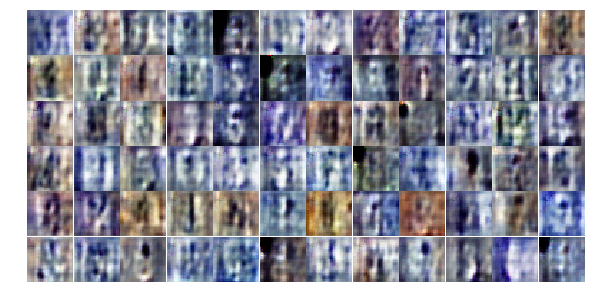

epoch 4/30 discriminator_loss: 0.3765 generator_loss: 2.6845
epoch 4/30 discriminator_loss: 0.8845 generator_loss: 2.0436
epoch 4/30 discriminator_loss: 1.0145 generator_loss: 0.8372
epoch 4/30 discriminator_loss: 0.6393 generator_loss: 1.6027
epoch 4/30 discriminator_loss: 1.0708 generator_loss: 0.8703
epoch 4/30 discriminator_loss: 0.5335 generator_loss: 2.0781
epoch 4/30 discriminator_loss: 0.5941 generator_loss: 1.5617
epoch 4/30 discriminator_loss: 0.8041 generator_loss: 1.4620
epoch 4/30 discriminator_loss: 0.5249 generator_loss: 3.0149
epoch 4/30 discriminator_loss: 0.9264 generator_loss: 2.1878


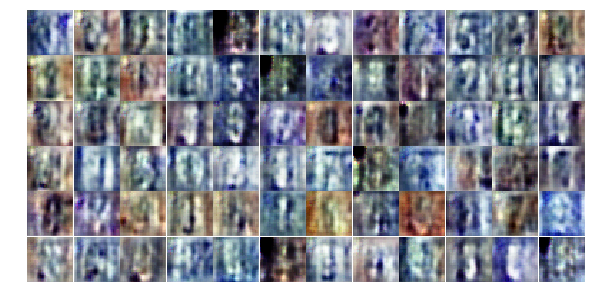

epoch 4/30 discriminator_loss: 1.0518 generator_loss: 0.6565
epoch 4/30 discriminator_loss: 0.6114 generator_loss: 2.5499
epoch 4/30 discriminator_loss: 0.5780 generator_loss: 2.4040
epoch 4/30 discriminator_loss: 1.2666 generator_loss: 0.5177
epoch 4/30 discriminator_loss: 1.0870 generator_loss: 0.9219
epoch 4/30 discriminator_loss: 1.5889 generator_loss: 0.4282
epoch 5/30 discriminator_loss: 0.5161 generator_loss: 2.5653
epoch 5/30 discriminator_loss: 0.7582 generator_loss: 1.5835
epoch 5/30 discriminator_loss: 0.6565 generator_loss: 2.5731
epoch 5/30 discriminator_loss: 1.1489 generator_loss: 0.6517


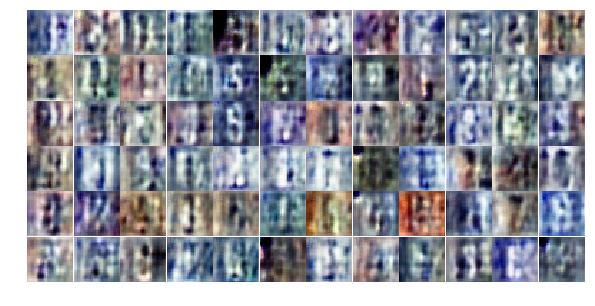

epoch 5/30 discriminator_loss: 0.4576 generator_loss: 2.7172
epoch 5/30 discriminator_loss: 0.8585 generator_loss: 3.1836
epoch 5/30 discriminator_loss: 0.7488 generator_loss: 1.1251
epoch 5/30 discriminator_loss: 0.3811 generator_loss: 2.6295
epoch 5/30 discriminator_loss: 0.8433 generator_loss: 1.3677
epoch 5/30 discriminator_loss: 0.7486 generator_loss: 1.2643
epoch 5/30 discriminator_loss: 1.3142 generator_loss: 0.5422
epoch 5/30 discriminator_loss: 0.6689 generator_loss: 1.6351
epoch 5/30 discriminator_loss: 0.8149 generator_loss: 2.1769
epoch 5/30 discriminator_loss: 0.5483 generator_loss: 2.9458


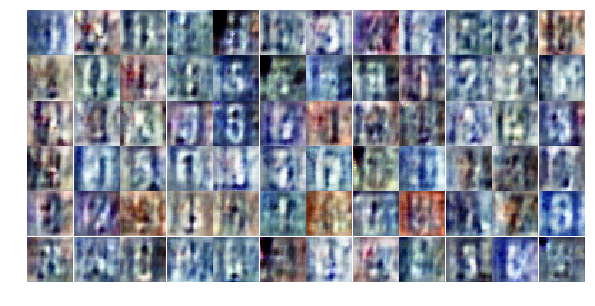

epoch 5/30 discriminator_loss: 0.6874 generator_loss: 1.2652
epoch 5/30 discriminator_loss: 0.7288 generator_loss: 1.4920
epoch 5/30 discriminator_loss: 0.7996 generator_loss: 1.4220
epoch 5/30 discriminator_loss: 0.5678 generator_loss: 3.2338
epoch 5/30 discriminator_loss: 1.0279 generator_loss: 0.9692
epoch 5/30 discriminator_loss: 0.4356 generator_loss: 3.3207
epoch 5/30 discriminator_loss: 0.8141 generator_loss: 1.0817
epoch 5/30 discriminator_loss: 0.5766 generator_loss: 2.9561
epoch 5/30 discriminator_loss: 1.2648 generator_loss: 0.5451
epoch 5/30 discriminator_loss: 1.1632 generator_loss: 1.0836


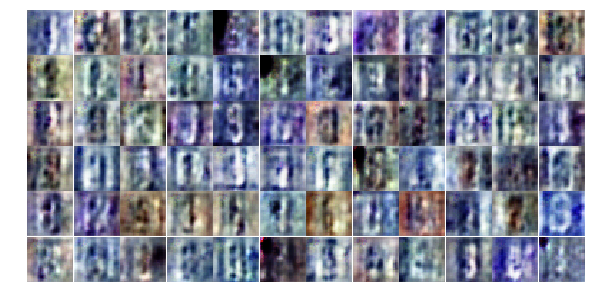

epoch 5/30 discriminator_loss: 0.5097 generator_loss: 1.5269
epoch 5/30 discriminator_loss: 0.6196 generator_loss: 2.3777
epoch 5/30 discriminator_loss: 0.4090 generator_loss: 1.8673
epoch 5/30 discriminator_loss: 0.7335 generator_loss: 1.7609
epoch 5/30 discriminator_loss: 0.9761 generator_loss: 1.2082
epoch 5/30 discriminator_loss: 0.9954 generator_loss: 1.3652
epoch 5/30 discriminator_loss: 1.2546 generator_loss: 0.7499
epoch 5/30 discriminator_loss: 0.6579 generator_loss: 1.5326
epoch 5/30 discriminator_loss: 1.0285 generator_loss: 1.2540
epoch 5/30 discriminator_loss: 1.2545 generator_loss: 2.5800


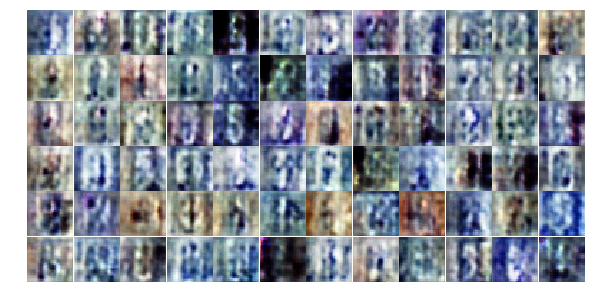

epoch 5/30 discriminator_loss: 0.7264 generator_loss: 2.3186
epoch 5/30 discriminator_loss: 1.2492 generator_loss: 0.9716
epoch 5/30 discriminator_loss: 0.8517 generator_loss: 1.0633
epoch 5/30 discriminator_loss: 0.8040 generator_loss: 1.2507
epoch 5/30 discriminator_loss: 1.1265 generator_loss: 1.0273
epoch 5/30 discriminator_loss: 1.2674 generator_loss: 0.9231
epoch 5/30 discriminator_loss: 1.0437 generator_loss: 1.0636
epoch 5/30 discriminator_loss: 0.5451 generator_loss: 2.0643
epoch 5/30 discriminator_loss: 0.4467 generator_loss: 1.9849
epoch 5/30 discriminator_loss: 1.4027 generator_loss: 0.5071


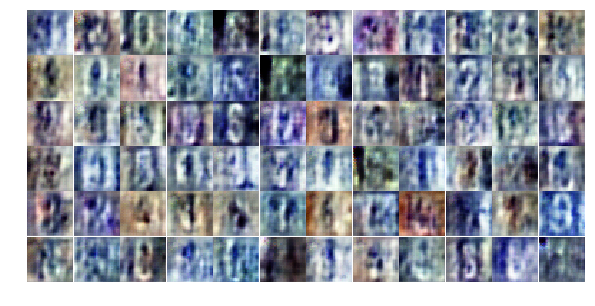

epoch 5/30 discriminator_loss: 0.6229 generator_loss: 1.8687
epoch 5/30 discriminator_loss: 0.8241 generator_loss: 1.3422
epoch 5/30 discriminator_loss: 1.3290 generator_loss: 0.6120
epoch 5/30 discriminator_loss: 1.2846 generator_loss: 0.9799
epoch 5/30 discriminator_loss: 0.5235 generator_loss: 2.3418
epoch 5/30 discriminator_loss: 0.1755 generator_loss: 3.8902
epoch 5/30 discriminator_loss: 0.1022 generator_loss: 3.1252
epoch 5/30 discriminator_loss: 0.1289 generator_loss: 3.3466
epoch 5/30 discriminator_loss: 0.1073 generator_loss: 5.0612
epoch 5/30 discriminator_loss: 0.1634 generator_loss: 4.3577


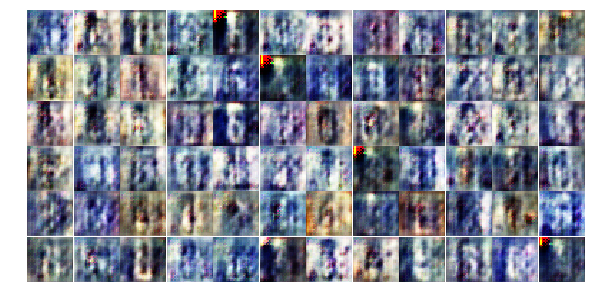

epoch 5/30 discriminator_loss: 0.2945 generator_loss: 2.0994
epoch 5/30 discriminator_loss: 0.1508 generator_loss: 2.6460
epoch 5/30 discriminator_loss: 0.1742 generator_loss: 3.2448
epoch 6/30 discriminator_loss: 0.0601 generator_loss: 4.7401
epoch 6/30 discriminator_loss: 0.0451 generator_loss: 5.3036
epoch 6/30 discriminator_loss: 0.1220 generator_loss: 3.3105
epoch 6/30 discriminator_loss: 0.0738 generator_loss: 4.1246
epoch 6/30 discriminator_loss: 0.0800 generator_loss: 4.9410
epoch 6/30 discriminator_loss: 0.0931 generator_loss: 4.1343
epoch 6/30 discriminator_loss: 0.0787 generator_loss: 4.1949


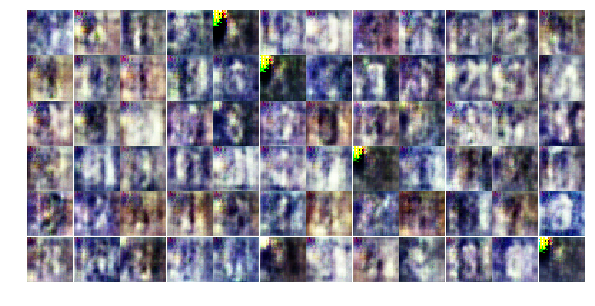

epoch 6/30 discriminator_loss: 0.0818 generator_loss: 4.6220
epoch 6/30 discriminator_loss: 0.0293 generator_loss: 6.7289
epoch 6/30 discriminator_loss: 0.1390 generator_loss: 3.5814
epoch 6/30 discriminator_loss: 0.0532 generator_loss: 3.9663
epoch 6/30 discriminator_loss: 0.1078 generator_loss: 3.6311
epoch 6/30 discriminator_loss: 0.0945 generator_loss: 3.5233
epoch 6/30 discriminator_loss: 0.0718 generator_loss: 3.8304
epoch 6/30 discriminator_loss: 0.1073 generator_loss: 4.0062
epoch 6/30 discriminator_loss: 0.7247 generator_loss: 2.7520
epoch 6/30 discriminator_loss: 0.1644 generator_loss: 3.8570


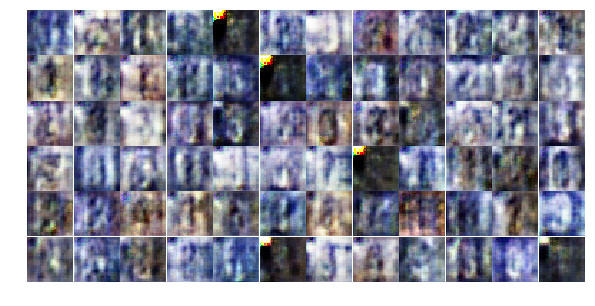

epoch 6/30 discriminator_loss: 0.0856 generator_loss: 5.0184
epoch 6/30 discriminator_loss: 0.3244 generator_loss: 2.2772
epoch 6/30 discriminator_loss: 0.0348 generator_loss: 6.2102
epoch 6/30 discriminator_loss: 0.1318 generator_loss: 3.1388
epoch 6/30 discriminator_loss: 0.3795 generator_loss: 1.8839
epoch 6/30 discriminator_loss: 0.0776 generator_loss: 3.9914
epoch 6/30 discriminator_loss: 0.2059 generator_loss: 2.4524
epoch 6/30 discriminator_loss: 0.0408 generator_loss: 4.6713
epoch 6/30 discriminator_loss: 0.1174 generator_loss: 3.3469
epoch 6/30 discriminator_loss: 0.5279 generator_loss: 1.3263


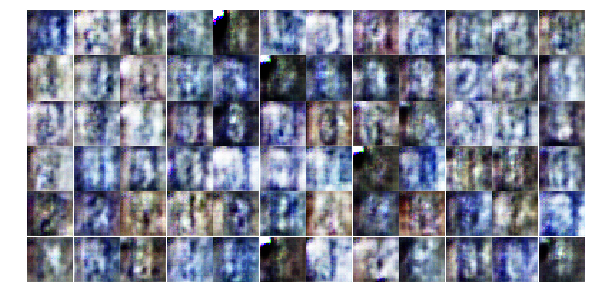

epoch 6/30 discriminator_loss: 0.2270 generator_loss: 2.8245
epoch 6/30 discriminator_loss: 1.2501 generator_loss: 0.5089
epoch 6/30 discriminator_loss: 0.1282 generator_loss: 2.5638
epoch 6/30 discriminator_loss: 0.1204 generator_loss: 3.3256
epoch 6/30 discriminator_loss: 0.2196 generator_loss: 2.4524
epoch 6/30 discriminator_loss: 0.4053 generator_loss: 1.5872
epoch 6/30 discriminator_loss: 0.1415 generator_loss: 2.8388
epoch 6/30 discriminator_loss: 0.1454 generator_loss: 2.9637
epoch 6/30 discriminator_loss: 0.0433 generator_loss: 4.4601
epoch 6/30 discriminator_loss: 0.0730 generator_loss: 3.7676


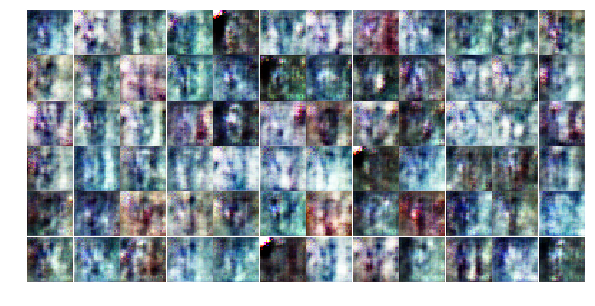

epoch 6/30 discriminator_loss: 0.1736 generator_loss: 2.8486
epoch 6/30 discriminator_loss: 0.1954 generator_loss: 2.1020
epoch 6/30 discriminator_loss: 0.2477 generator_loss: 2.2432
epoch 6/30 discriminator_loss: 0.0471 generator_loss: 4.4682
epoch 6/30 discriminator_loss: 0.1084 generator_loss: 3.4153
epoch 6/30 discriminator_loss: 0.1688 generator_loss: 2.8686
epoch 6/30 discriminator_loss: 0.1074 generator_loss: 4.3147
epoch 6/30 discriminator_loss: 0.0768 generator_loss: 3.1145
epoch 6/30 discriminator_loss: 0.1868 generator_loss: 2.6151
epoch 6/30 discriminator_loss: 0.0325 generator_loss: 5.0810


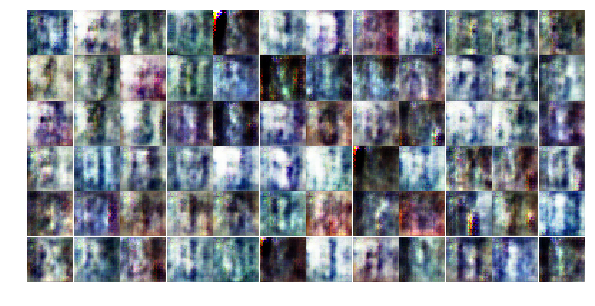

epoch 6/30 discriminator_loss: 0.0885 generator_loss: 4.9481
epoch 6/30 discriminator_loss: 0.0867 generator_loss: 4.4558
epoch 6/30 discriminator_loss: 0.1397 generator_loss: 2.6868
epoch 6/30 discriminator_loss: 0.0926 generator_loss: 3.7479
epoch 6/30 discriminator_loss: 0.0867 generator_loss: 4.0456
epoch 6/30 discriminator_loss: 0.0255 generator_loss: 7.0473
epoch 6/30 discriminator_loss: 0.0547 generator_loss: 3.8068
epoch 6/30 discriminator_loss: 0.1358 generator_loss: 3.2639
epoch 6/30 discriminator_loss: 0.0505 generator_loss: 4.6770
epoch 6/30 discriminator_loss: 0.0947 generator_loss: 3.5156


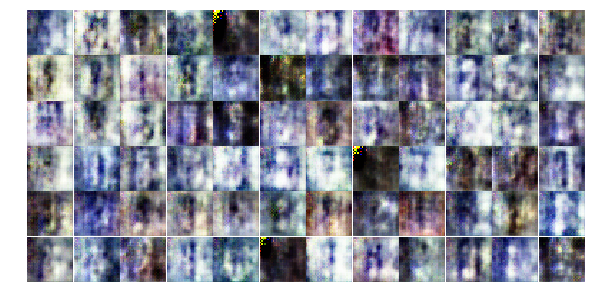

epoch 6/30 discriminator_loss: 0.5407 generator_loss: 1.8357
epoch 7/30 discriminator_loss: 0.2688 generator_loss: 2.3935
epoch 7/30 discriminator_loss: 0.1646 generator_loss: 5.7722
epoch 7/30 discriminator_loss: 2.9997 generator_loss: 5.6473
epoch 7/30 discriminator_loss: 0.5834 generator_loss: 1.8460
epoch 7/30 discriminator_loss: 0.3111 generator_loss: 1.8994
epoch 7/30 discriminator_loss: 0.5419 generator_loss: 1.3011
epoch 7/30 discriminator_loss: 0.7702 generator_loss: 1.0338
epoch 7/30 discriminator_loss: 0.7581 generator_loss: 1.1102
epoch 7/30 discriminator_loss: 1.1444 generator_loss: 1.3379


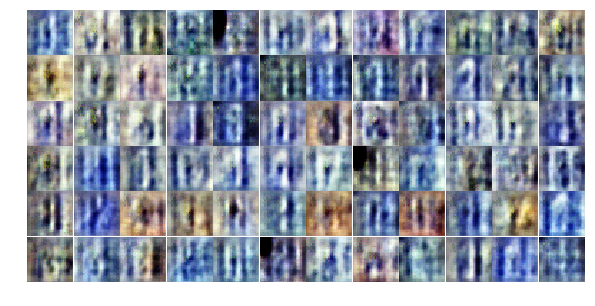

In [ ]:
'''GAN object'''
used_GAN = GAN(real_size, z_size, learning_rate, alpha = alpha, beta1 = beta1)
'''dataset object'''
used_dataset = Dataset(trainset, testset)
'''train the GAN object using the used_dataset'''
losses, samples = train(used_GAN, used_dataset, epochs, batch_size, figsize = (10, 5))

## plot losses

In [ ]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label = 'Discriminator', alpha = 0.5)
plt.plot(losses.T[1], label = 'Generator', alpha = 0.5)
plt.title('training losses')
plt.legend()

## plot some generated samples from trained generator

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize = (10, 5))

In [ ]:
_ = view_samples(-1, samples, 6, 12, figsize = (10, 5))